In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Import csv files

AC_Power = pd.read_csv("../data/Raw/Data_9068/9068_ac_power_data_20240101_20250430.csv")
Irradiance = pd.read_csv("../data/Raw/Data_9068/9068_irradiance_data_20240101_20250430.csv")
Weather = pd.read_csv("../data/Raw/NREL_Weather/1000190_40.38_-104.55_2024.csv",header=2)

In [3]:
AC_Power.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137249 entries, 0 to 137248
Data columns (total 13 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   measured_on                                   137249 non-null  object 
 1   inverter_module_1.1_ac_power_(kw)_inv_150135  137166 non-null  float64
 2   inverter_module_1.2_ac_power_(kw)_inv_150136  137166 non-null  float64
 3   inverter_module_1.3_ac_power_(kw)_inv_150137  137166 non-null  float64
 4   inverter_module_1.4_ac_power_(kw)_inv_150138  137166 non-null  float64
 5   inverter_module_2.1_ac_power_(kw)_inv_150139  135874 non-null  float64
 6   inverter_module_2.2_ac_power_(kw)_inv_150140  135874 non-null  float64
 7   inverter_module_2.3_ac_power_(kw)_inv_150141  135874 non-null  float64
 8   inverter_module_2.4_ac_power_(kw)_inv_150142  135874 non-null  float64
 9   inverter_1_ac_power_(kw)_inv_150143           13

In [4]:
Weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105120 entries, 0 to 105119
Data columns (total 28 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Year                   105120 non-null  int64  
 1   Month                  105120 non-null  int64  
 2   Day                    105120 non-null  int64  
 3   Hour                   105120 non-null  int64  
 4   Minute                 105120 non-null  int64  
 5   Temperature            105120 non-null  float64
 6   Alpha                  105120 non-null  float64
 7   Aerosol Optical Depth  105120 non-null  float64
 8   Asymmetry              105120 non-null  float64
 9   Clearsky DHI           105120 non-null  int64  
 10  Clearsky DNI           105120 non-null  int64  
 11  Clearsky GHI           105120 non-null  int64  
 12  Cloud Fill Flag        105120 non-null  int64  
 13  Cloud Type             105120 non-null  int64  
 14  Dew Point              105120 non-nu

In [5]:
#Restrict 9068 site data to 2024 and convert time to pandas Timestamp
AC_Power["measured_on"] = pd.to_datetime(AC_Power["measured_on"])
AC_Power = AC_Power[AC_Power["measured_on"].dt.year ==  2024]

Irradiance["measured_on"] = pd.to_datetime(Irradiance["measured_on"])
Irradiance = Irradiance[Irradiance["measured_on"].dt.year ==  2024]

In [6]:
AC_Power.sample(3)

,measured_on,inverter_module_1.1_ac_power_(kw)_inv_150135,inverter_module_1.2_ac_power_(kw)_inv_150136,inverter_module_1.3_ac_power_(kw)_inv_150137,inverter_module_1.4_ac_power_(kw)_inv_150138,inverter_module_2.1_ac_power_(kw)_inv_150139,inverter_module_2.2_ac_power_(kw)_inv_150140,inverter_module_2.3_ac_power_(kw)_inv_150141,inverter_module_2.4_ac_power_(kw)_inv_150142,inverter_1_ac_power_(kw)_inv_150143,inverter_2_ac_power_(kw)_inv_150144,inverter_1_power_factor_inv_150145,inverter_2_power_factor_inv_150146
94376,2024-12-01 12:05:00,243.1,243.4,245.3,245.6,225.2,225.5,224.4,225.7,980.0,905.0,1.00,1.00
69501,2024-09-04 07:10:00,11.5,11.4,11.0,10.1,10.6,9.6,9.6,9.6,43.0,38.0,0.99,0.99
73366,2024-09-18 08:40:00,401.8,400.7,400.7,402.9,NaN,NaN,NaN,NaN,1601.0,NaN,1.00,NaN


In [448]:
#Create/merge weather time columns into pandas Timestamp
Weather["DateTime"] = pd.to_datetime(Weather[["Year","Month","Day","Hour","Minute"]])
Weather.drop(columns=["Year","Month","Day","Hour","Minute"], inplace = True)

In [25]:
Weather.sample(3)

,Temperature,Alpha,Aerosol Optical Depth,Asymmetry,Clearsky DHI,Clearsky DNI,Clearsky GHI,Cloud Fill Flag,Cloud Type,Dew Point,...,Ozone,Relative Humidity,Solar Zenith Angle,SSA,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,DateTime
56298,36.1,1.83,0.138,0.62,131,886,962,0,3,8.4,...,0.292,18.40,20.37,0.94,0.20,855,2.7,24,3.9,2024-07-15 11:30:00
102354,11.7,1.36,0.019,0.62,46,854,304,0,7,-6.5,...,0.269,27.45,72.37,0.90,0.22,853,0.7,297,3.4,2024-12-22 09:30:00
50416,21.3,1.60,0.065,0.61,0,0,0,0,1,9.8,...,0.314,47.93,113.65,0.92,0.21,853,2.0,265,1.6,2024-06-25 01:20:00


In [449]:
#Combine inverter power output readings and remove other columns and missing data
AC_Power["Power"] = AC_Power[["inverter_1_ac_power_(kw)_inv_150143","inverter_2_ac_power_(kw)_inv_150144"]].sum(axis=1)
AC_Power.dropna(inplace=True)
Power = AC_Power.drop(columns=AC_Power.columns[1:-1])
Power.sample(3)

,measured_on,Power
111245,2025-01-29 01:50:00,0.0
43764,2024-06-04 00:15:00,0.0
66265,2024-08-24 01:30:00,0.0


In [ ]:
#Merge into one dataframe based on matching timestamps
#Any missing times in at least one data (e.g. 2024-02-29 in Weather) are removed
Merged_data = pd.merge(Power,Irradiance,left_on="measured_on",right_on="measured_on",how="inner")
Merged_data = pd.merge(Merged_data,Weather,left_on="measured_on",right_on="DateTime",how="inner")
Merged_data.drop(columns=["measured_on"],inplace=True)

In [23]:
Merged_data.sample(3)

,Power,pyranometer_(class_a)_pad_1_poa_irradiance_(w/m2)_o_149723,pyranometer_(class_a)_pad_1_poa_irradiance_temp_compensated_(w/m2)_o_149724,pyranometer_(class_a)_pad_2_poa_irradiance_(w/m2)_o_149725,pyranometer_(class_a)_pad_2_poa_irradiance_temp_compensated_(w/m2)_o_149726,Temperature,Alpha,Aerosol Optical Depth,Asymmetry,Clearsky DHI,...,Ozone,Relative Humidity,Solar Zenith Angle,SSA,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed,DateTime
46278,3312.0,883.55,883.56,868.94,868.98,26.8,1.24,0.064,0.61,81,...,0.323,25.63,51.51,0.91,0.21,849,1.5,55,3.7,2024-06-16 08:05:00
91599,389.0,164.58,164.23,112.62,112.95,2.6,1.57,0.018,0.61,35,...,0.308,43.36,79.18,0.91,0.22,855,0.5,340,2.9,2024-11-27 15:20:00
7501,0.0,-1.30,-1.32,-1.43,-1.44,-2.4,1.30,0.020,0.62,0,...,0.353,59.37,136.84,0.92,0.21,862,0.6,294,2.3,2024-01-27 03:05:00


In [8]:
#Dataframe of hourly data for each day
Merged_data_cleared = Merged_data.drop(columns=["Fill Flag", "Cloud Fill Flag"])

aggregation = {col: "mean" for col in Merged_data_cleared.columns[:-1]}
aggregation.update({"Precipitable Water" : "sum", "Power": "sum", "Cloud Type":lambda x: x.mode().iloc[0] if not x.mode().empty else None})

Merged_Hourly = Merged_data_cleared.resample("h", on="DateTime").agg(aggregation)
Merged_Hourly.dropna(inplace = True)

#Exclude hours with no power generated
Merged_Hourly_Power = Merged_Hourly[Merged_Hourly["Power"]>2000]

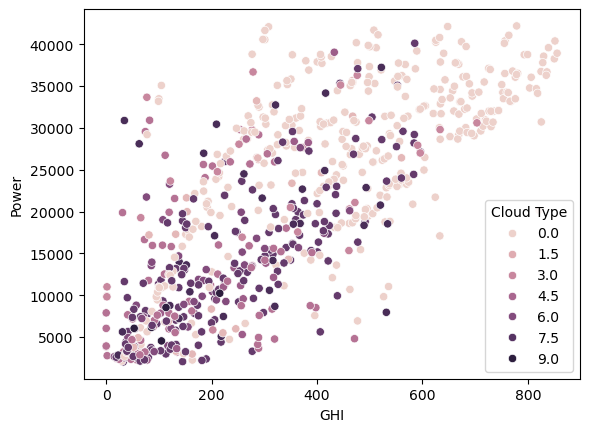

In [402]:
sns.scatterplot(Merged_Hourly_Power.iloc[0:30*24],x="GHI",y="Power",hue="Cloud Type")
plt.show()

In [265]:
Merged_Hourly_Power.sample(3)

,Power,pyranometer_(class_a)_pad_1_poa_irradiance_(w/m2)_o_149723,pyranometer_(class_a)_pad_1_poa_irradiance_temp_compensated_(w/m2)_o_149724,pyranometer_(class_a)_pad_2_poa_irradiance_(w/m2)_o_149725,pyranometer_(class_a)_pad_2_poa_irradiance_temp_compensated_(w/m2)_o_149726,Temperature,Alpha,Aerosol Optical Depth,Asymmetry,Clearsky DHI,...,GHI,Ozone,Relative Humidity,Solar Zenith Angle,SSA,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Wind Speed
DateTime,,,,,,,,,,,,,,,,,,,,,
2024-09-24 09:00:00,36899.0,833.316667,833.386667,823.884167,824.035000,21.750000,1.445833,0.044167,0.62,72.916667,...,623.916667,0.274917,32.681667,52.503333,0.910000,0.21,858.000000,22.8,342.916667,2.016667
2024-11-16 15:00:00,2097.0,70.657500,70.772500,68.996667,69.034167,10.050000,1.299167,0.041917,0.61,41.916667,...,115.000000,0.287333,33.117500,79.004167,0.934167,0.22,845.416667,8.4,122.000000,1.383333
2024-07-15 18:00:00,17359.0,0.000000,0.000000,412.626667,413.908333,24.091667,1.685833,0.264083,0.62,59.250000,...,102.416667,0.293000,44.253333,80.472500,0.961667,0.20,856.000000,37.8,121.500000,2.833333


In [9]:
#Dataframe of daily data
Merged_Daily = Merged_data_cleared.resample("d", on="DateTime").agg(aggregation)
Merged_Daily.dropna(inplace = True)

[]

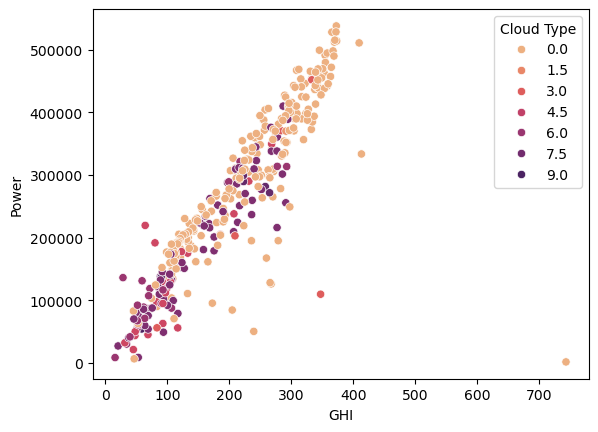

In [ ]:
sns.scatterplot(Merged_Daily,x="GHI",y="Power",hue="Cloud Type",palette=sns.color_palette("flare", as_cmap=True))
plt.plot()

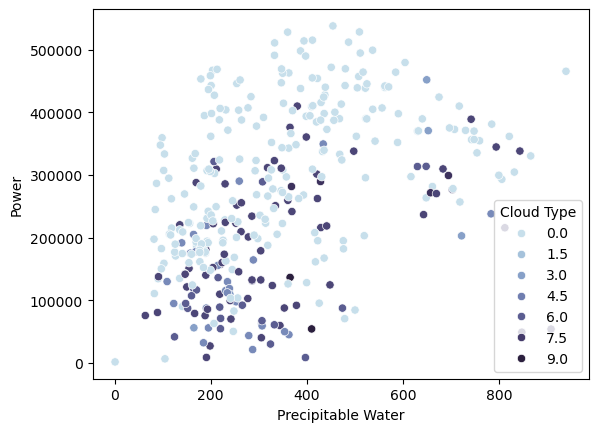

In [ ]:
sns.scatterplot(Merged_Daily,x="Precipitable Water",y="Power",hue="Cloud Type",palette=sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True))
plt.show()

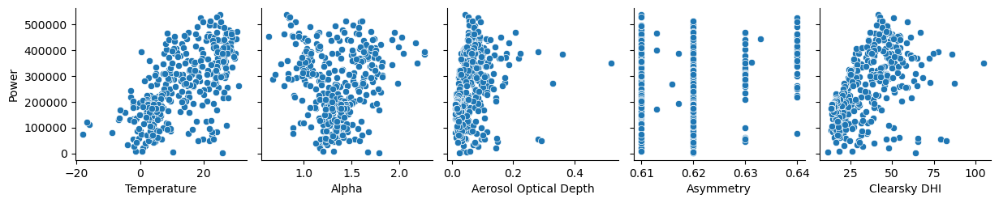

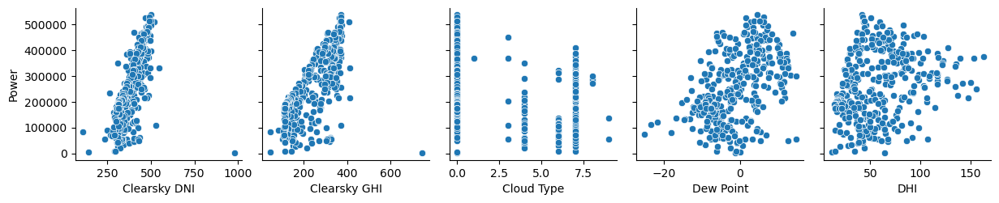

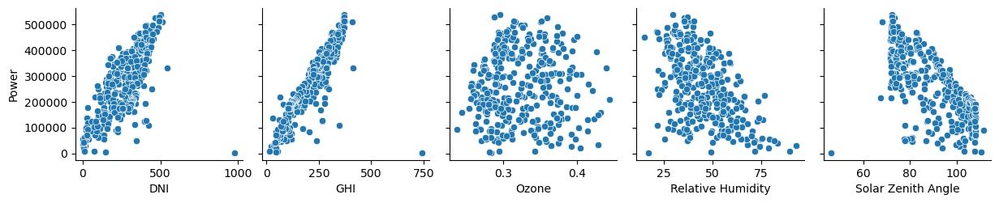

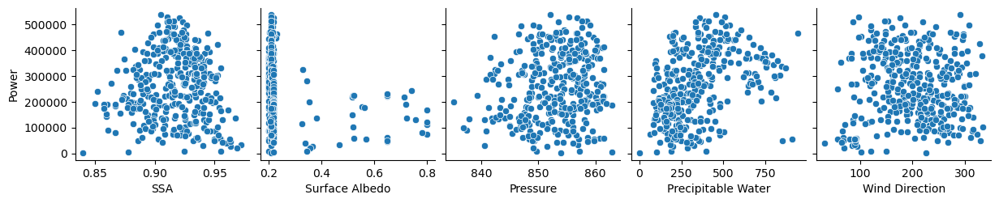

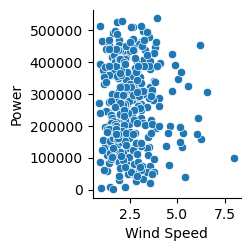

In [ ]:
#Graph daily power against all other features
for i in range (1,6):
    features = Merged_Daily.columns[5*i:5*(i+1)].tolist()
    sns.pairplot(Merged_Daily, x_vars=features, y_vars="Power")
plt.show()

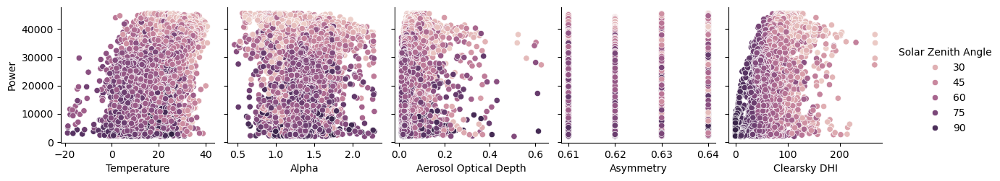

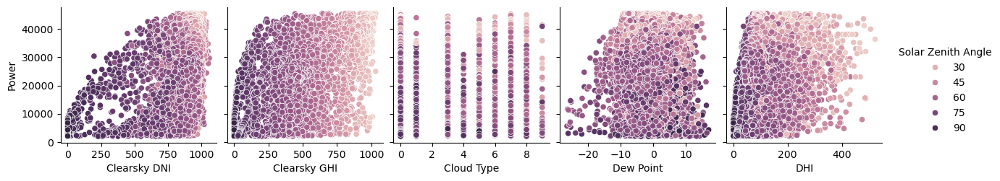

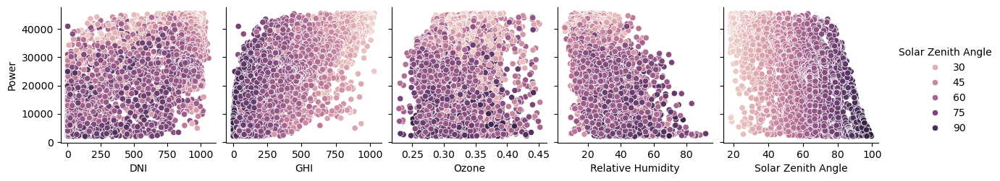

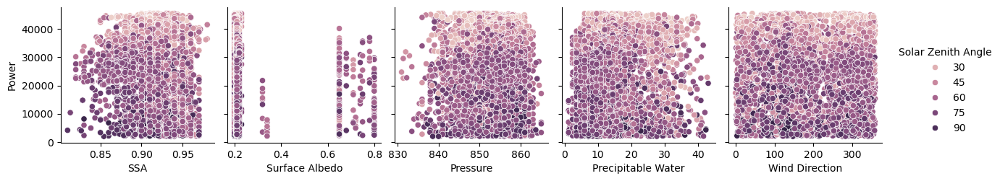

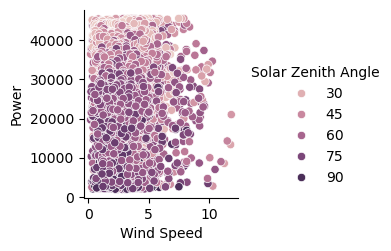

In [409]:
#Graph hourly power against all other features
for i in range (1,6):
    features = Merged_Hourly_Power.columns[5*i:5*(i+1)].tolist()
    sns.pairplot(Merged_Hourly_Power, x_vars=features, y_vars="Power",hue="Solar Zenith Angle")
plt.show()

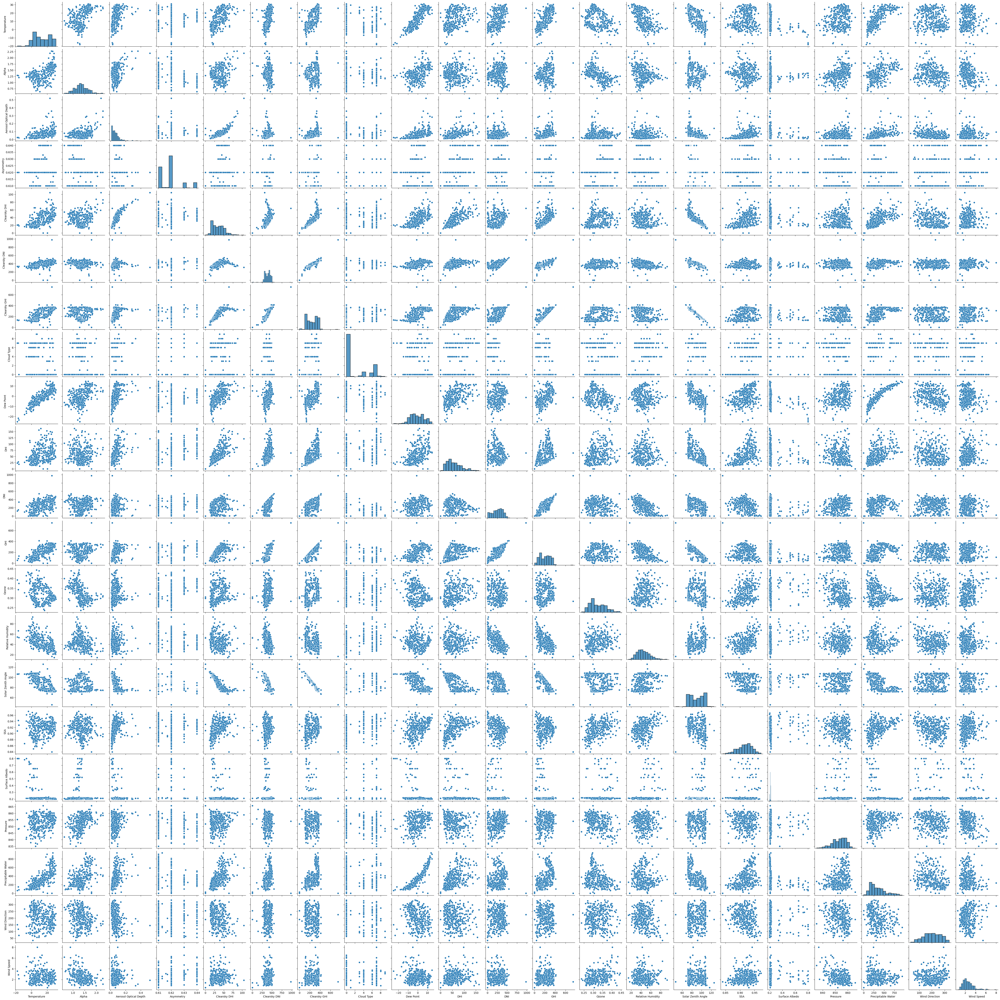

In [364]:
#Graph features against each other
sns.pairplot(Merged_Daily.iloc[:,5:])
plt.show()

In [ ]:
sns.pairplot(Merged_Daily,x=Merged_Daily.columns[1],x=Merged_Daily.columns[1])

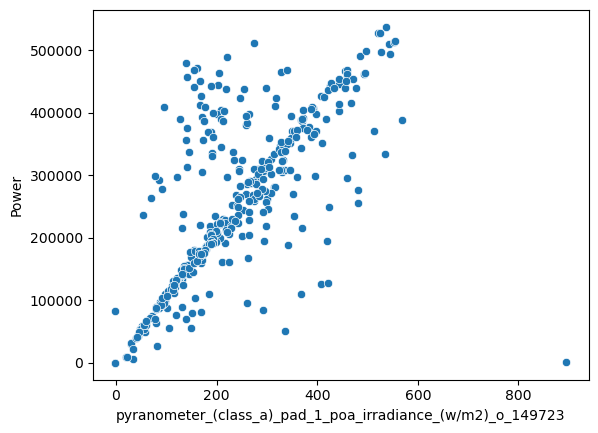

In [370]:
sns.scatterplot(Merged_Daily,x=Merged_Daily.columns[1],y="Power")
plt.show()

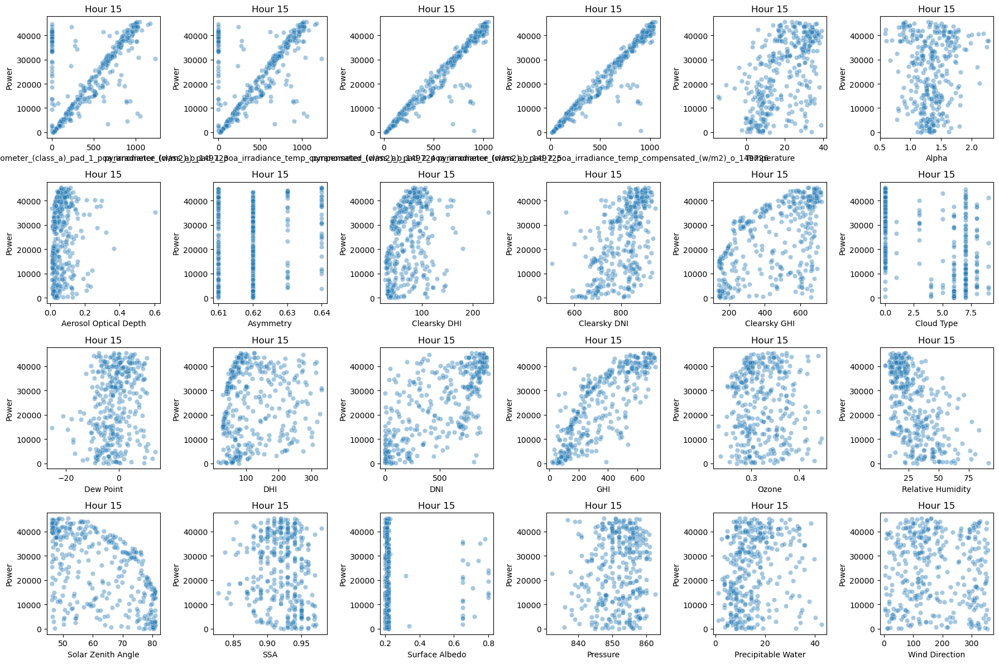

In [ ]:
#Graph all data points available against power output restricted to a specific hour
hour_view = 15

features = Merged_Hourly_Power.columns[1:-1]

fig, axes = plt.subplots(4,6,figsize=(18,12))
axes = axes.flatten()
i = 0

for feature in features:
    sns.scatterplot(Merged_Hourly_Power[Merged_Hourly_Power.index.hour == hour_view],x=feature,y="Power",alpha=0.4,ax=axes[i])
    axes[i].set_title(f"Hour {hour_view}")
    i+=1
plt.tight_layout()
plt.show()

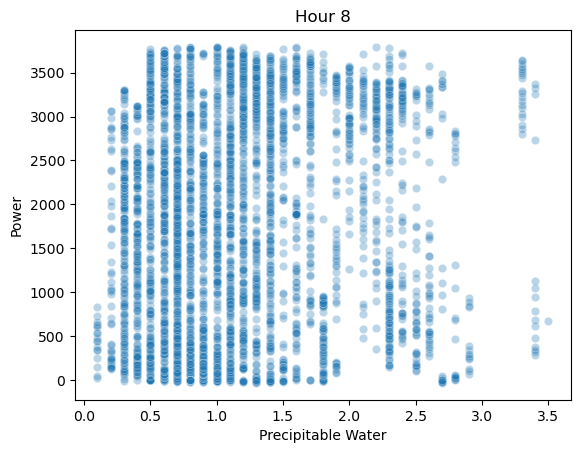

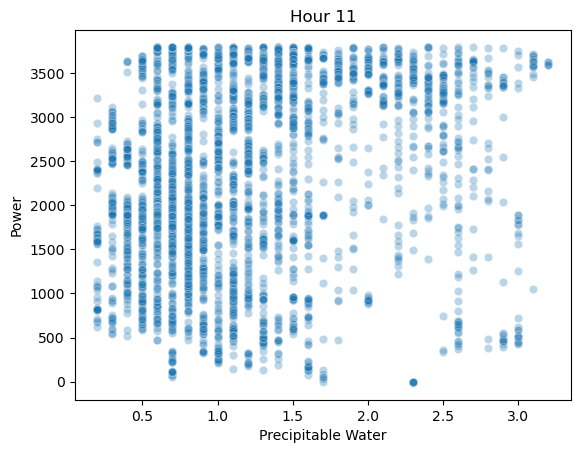

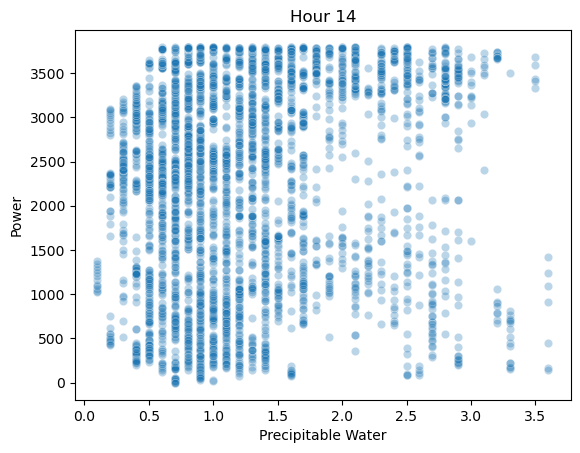

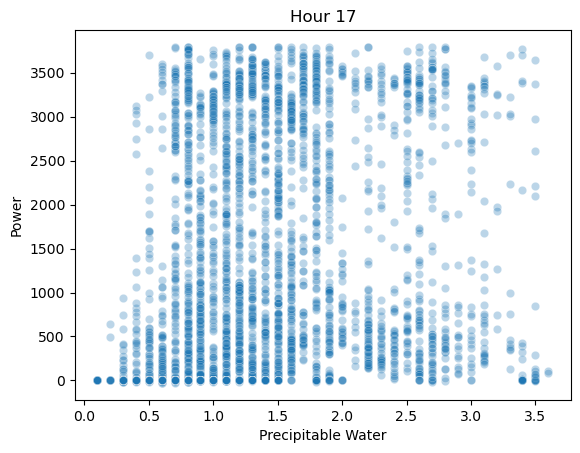

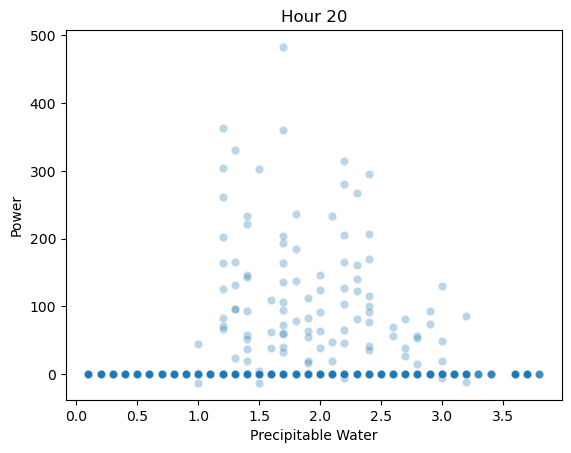

In [ ]:
#Graph against power output for chosen hours
start_hour = 8
stop_hour = 21
increment_hour = 3
weather_feather = "Precipitable Water"

for i in np.arange(start_hour,stop_hour,increment_hour):
    sns.scatterplot(Hourly_Dict[i],x=weather_feather,y="Power",alpha=0.3)
    plt.title(f"Hour {i}")
    plt.show()

In [392]:
Changed_Hour = Merged_Hourly[[Merged_Hourly.columns[0]]].copy()
Changed_Hour["Temperature"] = (Merged_Hourly["Temperature"]+273)**4
Changed_Hour["Power"] = Merged_Hourly["Power"]

In [390]:
Changed_Hour

DateTime
2024-01-01 00:00:00                                    5427676211.415352
2024-01-01 01:00:00                                    5457551085.057601
2024-01-01 02:00:00                                    5496474717.446743
2024-01-01 03:00:00                                    5531548441.703498
2024-01-01 04:00:00                                    5553893658.153119
                                             ...                        
2024-12-31 20:00:00                                    5439502151.071625
2024-12-31 21:00:00                                      5433495800.0625
2024-12-31 22:00:00                                    5428827633.767882
2024-12-31 23:00:00                                    5418168834.988166
Power                  DateTime
2024-01-01 00:00:00    0.0
2024-01-01...
Name: Temperature, Length: 8484, dtype: object

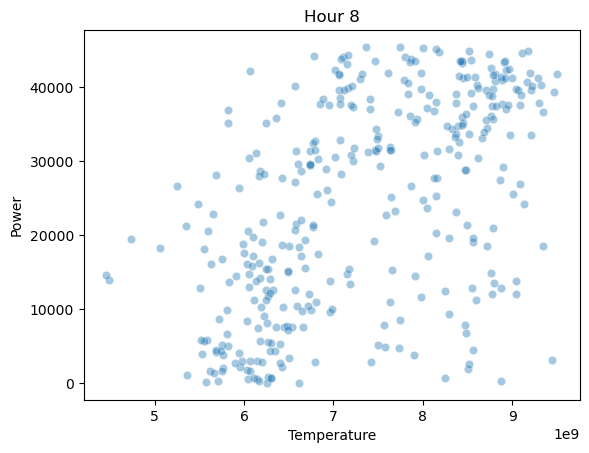

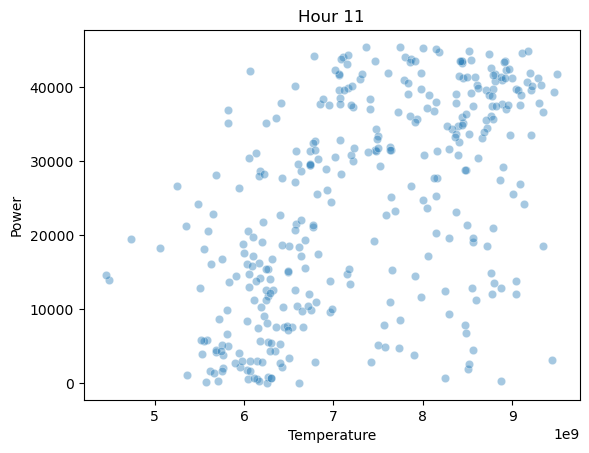

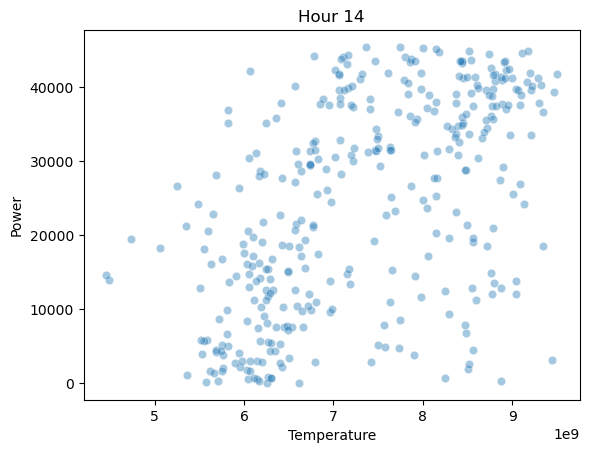

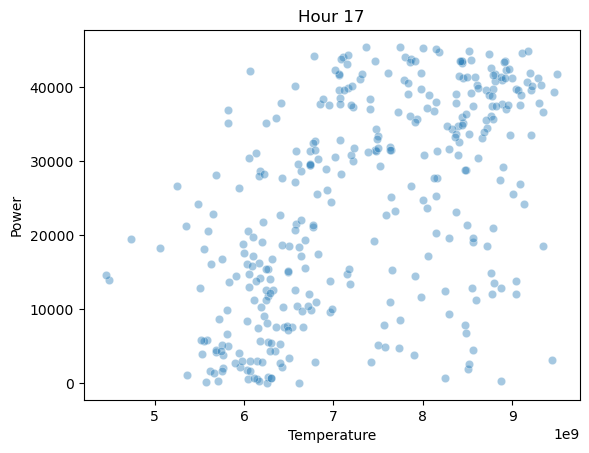

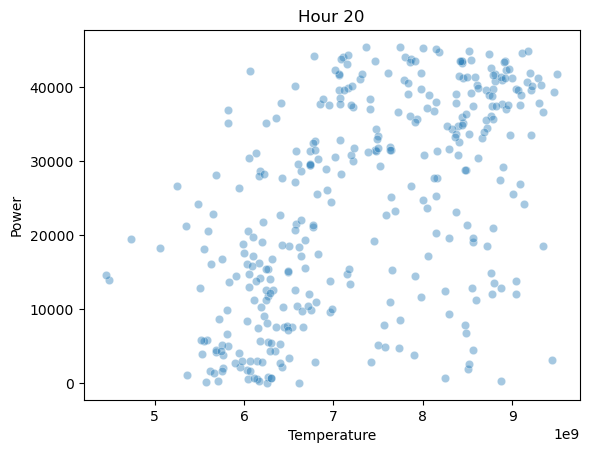

In [394]:

#Graph against power output for chosen hours
start_hour = 8
stop_hour = 21
increment_hour = 3
weather_feather = "Precipitable Water"

for i in np.arange(start_hour,stop_hour,increment_hour):
    sns.scatterplot(Changed_Hour[Changed_Hour.index.hour == hour_view],x="Temperature",y="Power",alpha=0.4)
    plt.title(f"Hour {i}")
    plt.show()

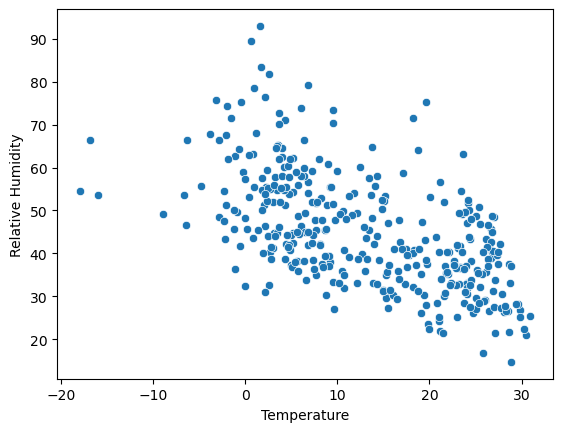

In [406]:
sns.scatterplot(Merged_Daily,x="Temperature",y="Relative Humidity")
plt.show()

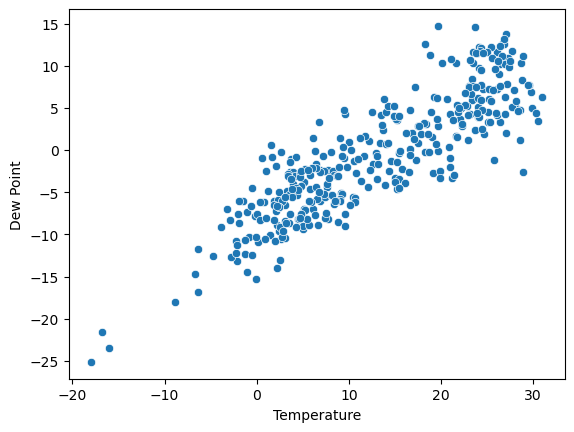

In [405]:
sns.scatterplot(Merged_Daily,x="Temperature",y="Dew Point")
plt.show()

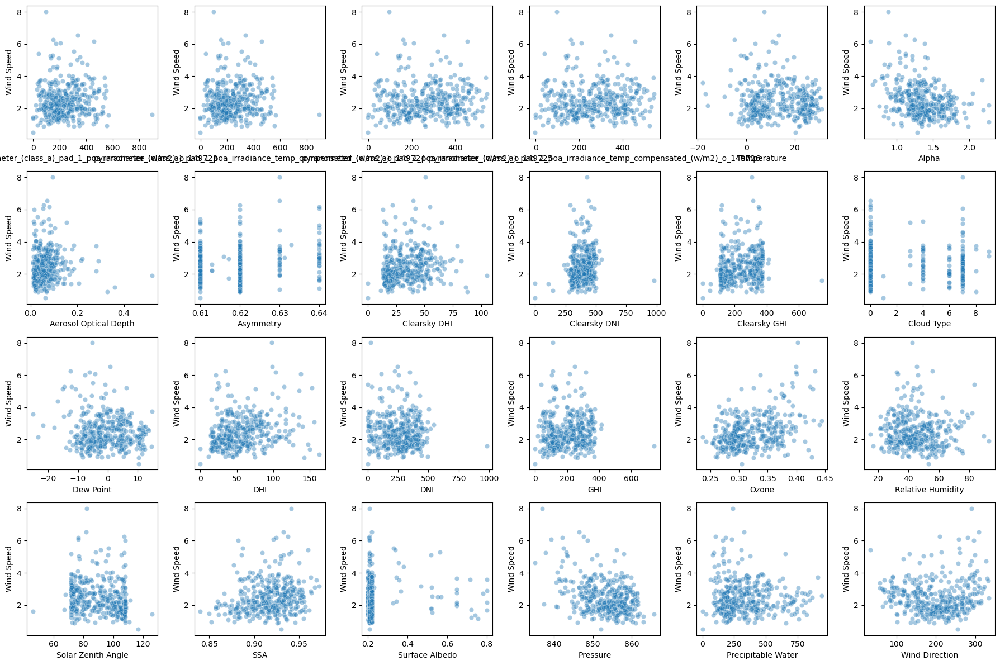

In [408]:
#Graph all data points available against power output restricted to a specific hour
features = Merged_Daily.columns[1:-1]

fig, axes = plt.subplots(4,6,figsize=(18,12))
axes = axes.flatten()
i = 0

for feature in features:
    sns.scatterplot(Merged_Daily,x=feature,y="Wind Speed",alpha=0.4,ax=axes[i])
    i+=1
plt.tight_layout()
plt.show()